In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import os
import glob
import re

In [ ]:
script_dir = os.getcwd()
base_dir = os.path.abspath(os.path.join(script_dir, os.pardir))
geojsons = glob.glob(os.path.join(base_dir, "Geojson", "*.geojson"))
fname = os.path.basename(geojsons[0])
state = os.path.splitext(fname)[0].split('_')[0]

In [3]:
#export villages csv
villages_geojson = os.path.join(base_dir, "Geojson", f"{state}_villages.geojson")
villages_gdf = gpd.read_file(villages_geojson)
villages_csv = villages_gdf.drop(columns=['geometry'])
villages_csv.to_csv(base_dir + r'/csv/kerala_villages.csv', index=False)

### Convert shapefile CRS

In [44]:
# build path for the villages geojson of the current state
district_geojson = os.path.join(base_dir, "Geojson", f"{state}_districts.geojson")
district = gpd.read_file(district_geojson)
district["object_id"] = district["stcode11"] +"-"+ district["dtcode11"] 
district.to_file(r"D:\CivicDataLab_IDS-DRR\IDS-DRR_Github\Deployment\flood-data-ecosystem-Bihar\Maps\br-ids-drr_shapefile\Bihar_district_final_4326.geojson", driver="GeoJSON")

subdistrict_geojson = os.path.join(base_dir, "Geojson", f"{state}_subdistricts.geojson")
subdistrict = gpd.read_file(subdistrict_geojson)
subdistrict["object_id"] = subdistrict["stcode11"] +"-"+ subdistrict["dtcode11"] + "-"+ subdistrict["sdtcode11"]

"""
district = district.set_crs(epsg=3857)
# 3. Reproject to WGS84 (lat/lon)
district = district.to_crs(epsg=4326)
# 4. Save out a new GeoJSON with decimal‐degree coords
district.to_file(r"D:\CivicDataLab_IDS-DRR\IDS-DRR_Github\Deployment\flood-data-ecosystem-Bihar\Maps\br-ids-drr_shapefile\Bihar_district_final_4326.geojson", driver="GeoJSON")
"""

<>:7: SyntaxWarning: invalid escape sequence '\C'
<>:7: SyntaxWarning: invalid escape sequence '\C'
C:\Users\saura\AppData\Local\Temp\ipykernel_65412\4154719585.py:7: SyntaxWarning: invalid escape sequence '\C'
  """


'\ndistrict = district.set_crs(epsg=3857)\n# 3. Reproject to WGS84 (lat/lon)\ndistrict = district.to_crs(epsg=4326)\n# 4. Save out a new GeoJSON with decimal‐degree coords\ndistrict.to_file(r"D:\\CivicDataLab_IDS-DRR\\IDS-DRR_Github\\Deployment\x0clood-data-ecosystem-Bihar\\Maps\x08r-ids-drr_shapefile\\Bihar_district_final_4326.geojson", driver="GeoJSON")\n'

In [41]:
### Prepare urban shapefile
village_df_unfiltered = villages_gdf.copy()
village_urban = village_df_unfiltered.replace(r'^\s*$', np.nan, regex=True)
village_urban = village_urban.dropna(subset=['vilnam_soi'])
village_urban = village_urban.dropna(subset=['vilname11'])
village_urban = village_urban.dropna(subset=['gp_name'])
village_urban = village_urban.loc[village_urban["stname"] == state.upper()]
village_urban["vilnam_soi"] = village_urban["vilnam_soi"].str.upper()
village_urban = village_urban[~village_urban["vilnam_soi"].str.contains("FOREST", na=False)]
village_urban = village_urban[~village_urban["vilnam_soi"].str.contains("R.F", na=False, regex=False)]
village_urban = village_urban[~village_urban["vilnam_soi"].str.contains("D.P.F", na=False, regex=False)]
village_urban = village_urban[~village_urban["vilnam_soi"].str.contains("JUNGLE", na=False)]
village_urban = village_urban[~village_urban["vilnam_soi"].str.contains(" HILL", na=False)]
village_urban = village_urban[~village_urban["vilnam_soi"].str.contains("R F", na=False)]

# --- LGD urban classification from vilname11 suffix ---
suffix_pattern = r'\(([^)]+)\)$'
village_urban = village_urban.copy()
village_urban["_ulb_type"] = village_urban["vilname11"].str.extract(suffix_pattern, expand=False)

# CT (Census Town) and OG (Out Growth) are the urban types in the village shapefile.
# Statutory towns (M Corp., M, etc.) are in a separate town shapefile.
urban_types = ['M Corp.', 'M', 'NP', 'NPP', 'NAC', 'CB', 'CT', 'OG', 'INA', 'IT']
village_urban["is_urban"] = village_urban["_ulb_type"].isin(urban_types)

urban_gdf = village_urban[village_urban["is_urban"]]
rural_gdf = village_urban[~village_urban["is_urban"]]

print(f"Urban (CT + OG): {len(urban_gdf)}")
print(f"Rural          : {len(rural_gdf)}")
print(f"Total          : {len(village_urban)}")

urban_gdf.to_file(os.path.join(base_dir, "Geojson", f"{state}_urban.geojson"), driver="GeoJSON")

Urban (CT + OG): 395
Rural          : 982
Total          : 1377


In [ ]:
# --- Load Mission Antyodaya for rural MA data ---
antyodaya_file = r"D:\CivicDataLab_IDS-DRR\IDS-DRR_Github\Deployment\flood-data-ecosystem-generic\Maps\csv\MissionAntyodaya_allIndia.csv"
antyodaya = pd.read_csv(antyodaya_file)
antyodaya_kl = antyodaya[antyodaya['state_name'] == state.upper()].copy()
antyodaya_kl['village_name'] = antyodaya_kl['village_name'].str.upper()

# Normalise join key types
village_urban["vilcode11"] = village_urban["vilcode11"].astype("Int64")
antyodaya_kl["village_code"] = antyodaya_kl["village_code"].astype("Int64")

# Join MA data onto rural villages only
rural_with_ma = pd.merge(
    rural_gdf, antyodaya_kl,
    left_on='vilcode11', right_on='village_code', how='inner'
)

print(f"\nRural matched to MA: {len(rural_with_ma)}")
print(f"Urban (use WorldPop / 4.3 for HHs): {len(urban_gdf)}")


In [ ]:
urban_types = ['M Corp.', 'M', 'NP', 'NPP', 'NAC', 'CB', 'CT', 'OG', 'INA', 'IT']

city_entries = village_urban[village_urban["_ulb_type"].isin(urban_types)][
    ["vilname11", "_ulb_type", "vilnam_soi", "dtname", "vilcode11"]
]

In [35]:

# LGD urban classification is embedded as a parenthetical suffix in vilname11.
# Extract all unique suffixes to see which urban type codes exist in this dataset.
# e.g. "THIRUVANANTHAPURAM (M Corp.)" → "(M Corp.)"
suffix_pattern = r'\(([^)]+)\)$'

village_urban["_ulb_type"] = village_urban["vilname11"].str.extract(suffix_pattern, expand=False)
print(village_urban["_ulb_type"].value_counts(dropna=False).to_string())

_ulb_type
NaN     951
CT      389
Part     31
OG        6


In [36]:

# LGD urban local body types (from Census 2011 / LGD hierarchy):
#   M Corp.  – Municipal Corporation  (largest cities)
#   M        – Municipality
#   NP / NPP – Nagar Panchayat
#   NAC      – Notified Area Committee
#   CB       – Cantonment Board
#   CT       – Census Town (urban by Census criteria, no ULB)
#   OG       – Out Growth (fringe of a statutory town)
#   INA / IT – Industrial Notified Area / Industrial Township
#
# Rows WITHOUT a suffix are rural villages (no LGD urban classification).

urban_types = ['M Corp.', 'M', 'NP', 'NPP', 'NAC', 'CB', 'CT', 'OG', 'INA', 'IT']

city_entries = village_urban[village_urban["_ulb_type"].isin(urban_types)][
    ["vilname11", "_ulb_type", "vilnam_soi", "dtname", "vilcode11"]
].sort_values(["_ulb_type", "vilname11"])

print(f"City / town entries in village_urban: {len(city_entries)}")
city_entries

City / town entries in village_urban: 395


,vilname11,_ulb_type,vilnam_soi,dtname,vilcode11
1172,Abdu Rahiman Nagar (CT),CT,KODUVAYUR,Malappuram,627552
1086,Adat (CT),CT,ADATTU,Thrissur,627842
275,Adichanalloor (CT),CT,ADICHANALLUR,Kollam,628447
379,Adinad (CT),CT,ADINADU,Kollam,628365
493,Aimanam (CT),CT,AIMANAM,Kottayam,628173
...,...,...,...,...,...
1597,Cheruvathur (OG),OG,CHERUVATTUR,Kasaragod,627176
920,Eriyad (OG),OG,ERIYAD,Thrissur,627885
1279,Kadalundi (OG),OG,KADALUNDI,Kozhikode,627442
360,Neendakara (OG),OG,NINIAKARA,Kollam,628373


In [22]:
village_urban
# Compare gp_code across both dataframes
soi_gp  = set(village_urban["vilcode11"].dropna().astype(str))
anty_gp = set(antyodaya_kl["village_code"].dropna().astype(str))

in_both_gp      = soi_gp & anty_gp
only_in_soi_gp  = soi_gp - anty_gp
only_in_anty_gp = anty_gp - soi_gp

print(f"Total SOI gp_codes       : {len(soi_gp)}")
print(f"Total Antyodaya gp_codes : {len(anty_gp)}")
print(f"In both                  : {len(in_both_gp)}")
print(f"Only in SOI              : {len(only_in_soi_gp)}")
print(f"Only in Antyodaya        : {len(only_in_anty_gp)}")

Total SOI gp_codes       : 1365
Total Antyodaya gp_codes : 1434
In both                  : 0
Only in SOI              : 1365
Only in Antyodaya        : 1434


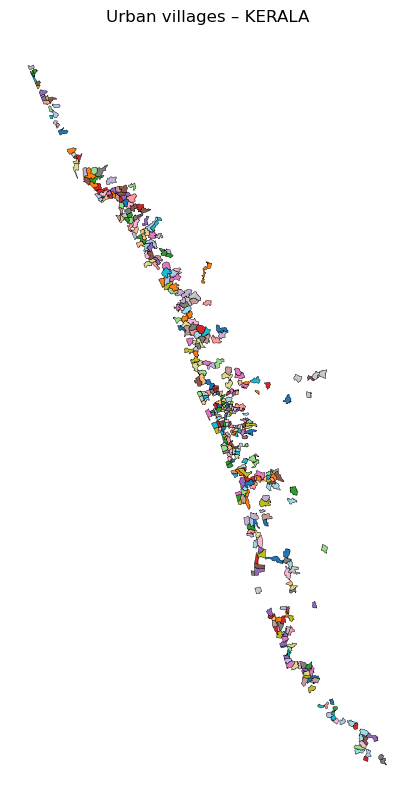

C:\Users\saura\AppData\Local\Temp\ipykernel_228056\724992451.py:18: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centre = [vu.geometry.centroid.y.mean(), vu.geometry.centroid.x.mean()]


In [39]:
import folium

# static plot with geopandas/matplotlib
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
# draw filled polygons (or .boundary for outlines only)
urban_gdf.plot(ax=ax, column='vilnam_soi', cmap='tab20', legend=False,
                   edgecolor='k', linewidth=0.3)
ax.set_title('Urban villages – {}'.format(state.upper()))
ax.set_axis_off()
plt.show()

# …or, for an interactive map, use folium

# make sure geometry is in lat/lon
vu = village_urban.to_crs(epsg=4326)
centre = [vu.geometry.centroid.y.mean(), vu.geometry.centroid.x.mean()]
m = folium.Map(location=centre, zoom_start=7, tiles='CartoDB positron')
folium.GeoJson(vu, name='urban').add_to(m)
m  # display in notebook

### Create district object-id reference

In [14]:
bihar_district_asset = bihar_district[['object-id','dtname']]
bihar_district_asset.to_csv(r'D:\CivicDataLab_IDS-DRR\IDS-DRR_Github\Deployment\IDS-DRR-Bihar-Risk-Score-Model\RiskScoreModel\assets\district_objectid.csv')